## K Nearest Neighbors with Python

You've been given a classified data set from a company! They've hidden the feature column names but have given you the data and the target classes.

We'll try to use KNN to create a model that directly predicts a class for a new data point based off of the features.

Let's grab it and use it!

https://github.com/krishnaik06/K-Nearest-Neighour

In [11]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport

In [4]:
df = pd.read_csv('Classified Data',index_col=0)
df.head()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ,TARGET CLASS
0,0.913917,1.162073,0.567946,0.755464,0.780862,0.352608,0.759697,0.643798,0.879422,1.231409,1
1,0.635632,1.003722,0.535342,0.825645,0.924109,0.648450,0.675334,1.013546,0.621552,1.492702,0
2,0.721360,1.201493,0.921990,0.855595,1.526629,0.720781,1.626351,1.154483,0.957877,1.285597,0
3,1.234204,1.386726,0.653046,0.825624,1.142504,0.875128,1.409708,1.380003,1.522692,1.153093,1
4,1.279491,0.949750,0.627280,0.668976,1.232537,0.703727,1.115596,0.646691,1.463812,1.419167,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   WTT           1000 non-null   float64
 1   PTI           1000 non-null   float64
 2   EQW           1000 non-null   float64
 3   SBI           1000 non-null   float64
 4   LQE           1000 non-null   float64
 5   QWG           1000 non-null   float64
 6   FDJ           1000 non-null   float64
 7   PJF           1000 non-null   float64
 8   HQE           1000 non-null   float64
 9   NXJ           1000 non-null   float64
 10  TARGET CLASS  1000 non-null   int64  
dtypes: float64(10), int64(1)
memory usage: 93.8 KB


In [6]:
df.describe()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ,TARGET CLASS
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,0.949682,1.114303,0.834127,0.682099,1.032336,0.943534,0.963422,1.071960,1.158251,1.362725,0.50000
std,0.289635,0.257085,0.291554,0.229645,0.243413,0.256121,0.255118,0.288982,0.293738,0.204225,0.50025
min,0.174412,0.441398,0.170924,0.045027,0.315307,0.262389,0.295228,0.299476,0.365157,0.639693,0.00000
25%,0.742358,0.942071,0.615451,0.515010,0.870855,0.761064,0.784407,0.866306,0.934340,1.222623,0.00000
50%,0.940475,1.118486,0.813264,0.676835,1.035824,0.941502,0.945333,1.065500,1.165556,1.375368,0.50000
75%,1.163295,1.307904,1.028340,0.834317,1.198270,1.123060,1.134852,1.283156,1.383173,1.504832,1.00000
max,1.721779,1.833757,1.722725,1.634884,1.650050,1.666902,1.713342,1.785420,1.885690,1.893950,1.00000


In [12]:
profile = ProfileReport(df, title="Pandas Profiling Report", explorative=True)

In [16]:
profile

In [14]:
X = df.drop(['TARGET CLASS'], axis=1)
X.head()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ
0,0.913917,1.162073,0.567946,0.755464,0.780862,0.352608,0.759697,0.643798,0.879422,1.231409
1,0.635632,1.003722,0.535342,0.825645,0.924109,0.648450,0.675334,1.013546,0.621552,1.492702
2,0.721360,1.201493,0.921990,0.855595,1.526629,0.720781,1.626351,1.154483,0.957877,1.285597
3,1.234204,1.386726,0.653046,0.825624,1.142504,0.875128,1.409708,1.380003,1.522692,1.153093
4,1.279491,0.949750,0.627280,0.668976,1.232537,0.703727,1.115596,0.646691,1.463812,1.419167


In [15]:
y = df['TARGET CLASS']
y.head()

0    1
1    0
2    0
3    1
4    1
Name: TARGET CLASS, dtype: int64

### Pair Plot

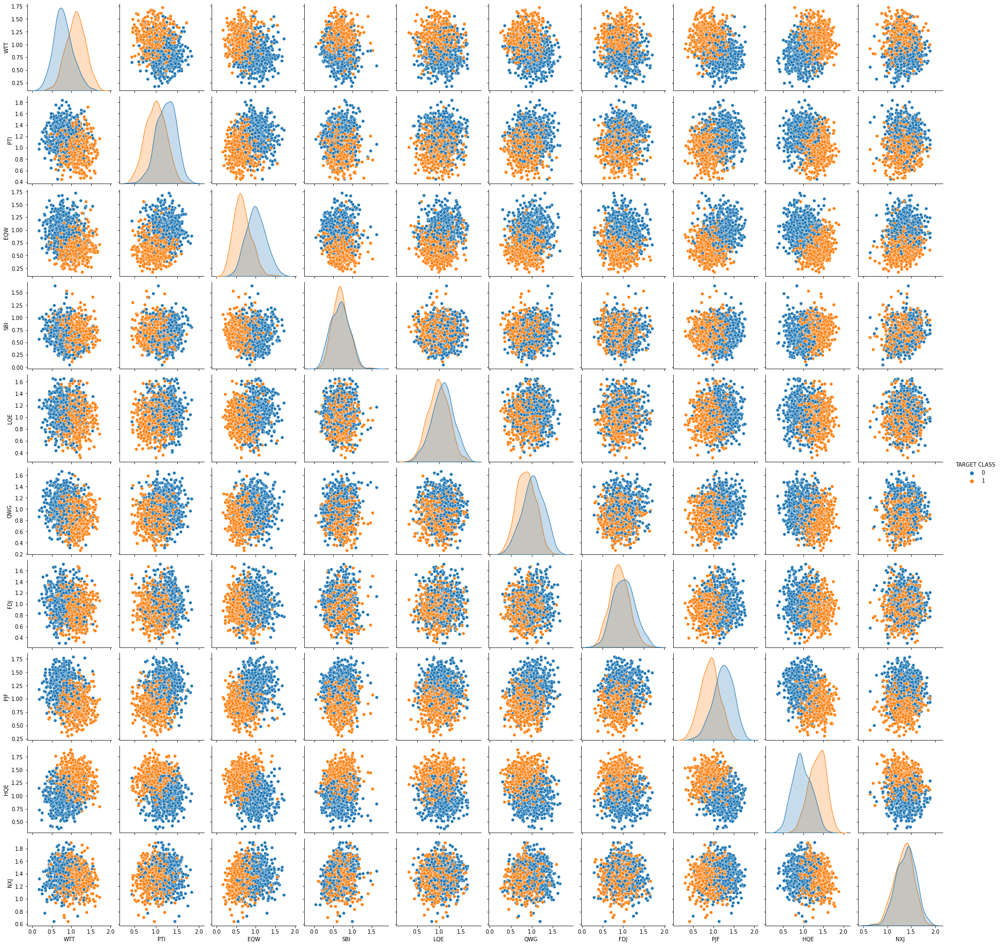

In [17]:
import seaborn as sns

sns.pairplot(df,hue='TARGET CLASS')

In [18]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)

### Scaling

In [19]:
from sklearn.preprocessing import StandardScaler

In [21]:
sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [23]:
pd.DataFrame(X_train)

,0,1,2,3,4,5,6,7,8,9
0,-0.556591,-0.036544,-0.440059,0.387501,0.302513,0.792463,2.868156,1.409515,-0.322797,-0.974091
1,1.257780,-1.599825,-0.660568,-0.238849,-0.379648,-0.701036,-0.086153,-0.308210,0.615128,1.191879
2,1.549699,-0.631949,-1.689456,-1.050357,-0.804310,0.483951,-0.119326,-0.985996,-0.734204,-1.154024
3,0.445817,-1.239570,-0.280311,-0.631187,0.773868,-1.203116,0.037105,-1.293092,1.234615,-0.030791
4,-1.094387,0.919440,-0.042074,-1.303230,-0.788729,-0.576258,0.732287,0.599323,0.167401,0.096505
...,...,...,...,...,...,...,...,...,...,...
695,-0.920001,0.123818,0.224108,-0.350379,0.237848,-0.202888,-2.592966,0.254995,-0.844876,0.234173
696,0.649060,-0.143270,-0.825304,-2.002091,-0.978228,-0.199193,-0.255490,-1.458575,-0.114618,-1.341550
697,1.377347,-1.417394,-0.801476,-0.471782,-1.593304,0.307683,-0.982655,-0.054271,0.543556,0.232485
698,-2.369065,0.616230,0.888468,0.339019,-0.512379,1.115628,1.981634,-0.159818,-0.283545,-0.850142


### Using KNN

Remember that we are trying to come up with a model to predict whether someone will TARGET CLASS or not. We'll start with k=1.

In [24]:
knn = KNeighborsClassifier(n_neighbors=1)

In [25]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [26]:
pred = knn.predict(X_test)

### Predictions and Evaluations

Let's evaluate our KNN model!

In [32]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score

In [29]:
cm = confusion_matrix(y_test,pred)

In [31]:
print(type(cm))
cm

<class 'numpy.ndarray'>


array([[131,  17],
       [ 17, 135]])

In [35]:
cp = classification_report(y_test,pred)
print(type(cp))
print(cp)

<class 'str'>
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       148
           1       0.89      0.89      0.89       152

    accuracy                           0.89       300
   macro avg       0.89      0.89      0.89       300
weighted avg       0.89      0.89      0.89       300



### Choosing a K Value
Let's go ahead and use the elbow method to pick a good K Value:

In [36]:
scaled_features = sc.fit_transform(X)

df_feat = pd.DataFrame(scaled_features,columns=df.columns[:-1])
df_feat.head()

,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ
0,-0.123542,0.185907,-0.913431,0.319629,-1.033637,-2.308375,-0.798951,-1.482368,-0.949719,-0.643314
1,-1.084836,-0.430348,-1.025313,0.625388,-0.444847,-1.152706,-1.129797,-0.202240,-1.828051,0.636759
2,-0.788702,0.339318,0.301511,0.755873,2.031693,-0.870156,2.599818,0.285707,-0.682494,-0.377850
3,0.982841,1.060193,-0.621399,0.625299,0.452820,-0.267220,1.750208,1.066491,1.241325,-1.026987
4,1.139275,-0.640392,-0.709819,-0.057175,0.822886,-0.936773,0.596782,-1.472352,1.040772,0.276510


In [40]:
accuracy_rate = []
error_rate = []
for k in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn,df_feat,y,cv=10)
    accuracy_rate.append(score.mean())
    error_rate.append(1-score.mean())

In [42]:
accuracy_rate

[0.9109999999999999,
 0.909,
 0.9280000000000002,
 0.9339999999999999,
 0.9289999999999999,
 0.929,
 0.9310000000000003,
 0.9340000000000002,
 0.9289999999999999,
 0.9350000000000002,
 0.9329999999999998,
 0.9350000000000002,
 0.937,
 0.9410000000000001,
 0.9390000000000001,
 0.9390000000000001,
 0.9349999999999999,
 0.9360000000000002,
 0.9360000000000002,
 0.9360000000000002,
 0.9339999999999999,
 0.9359999999999999,
 0.93,
 0.933,
 0.9349999999999999,
 0.937,
 0.9380000000000001,
 0.938,
 0.937,
 0.9390000000000001,
 0.9360000000000002,
 0.943,
 0.937,
 0.9390000000000001,
 0.9390000000000001,
 0.9400000000000001,
 0.9369999999999999,
 0.943,
 0.9410000000000001]

In [43]:
error_rate

[0.08900000000000008,
 0.09099999999999997,
 0.07199999999999984,
 0.06600000000000006,
 0.07100000000000006,
 0.07099999999999995,
 0.06899999999999973,
 0.06599999999999984,
 0.07100000000000006,
 0.06499999999999984,
 0.06700000000000017,
 0.06499999999999984,
 0.06299999999999994,
 0.05899999999999994,
 0.06099999999999994,
 0.06099999999999994,
 0.06500000000000006,
 0.06399999999999983,
 0.06399999999999983,
 0.06399999999999983,
 0.06600000000000006,
 0.06400000000000006,
 0.06999999999999995,
 0.06699999999999995,
 0.06500000000000006,
 0.06299999999999994,
 0.061999999999999944,
 0.062000000000000055,
 0.06299999999999994,
 0.06099999999999994,
 0.06399999999999983,
 0.05700000000000005,
 0.06299999999999994,
 0.06099999999999994,
 0.06099999999999994,
 0.05999999999999994,
 0.06300000000000006,
 0.05700000000000005,
 0.05899999999999994]

Text(0, 0.5, 'Error Rate')

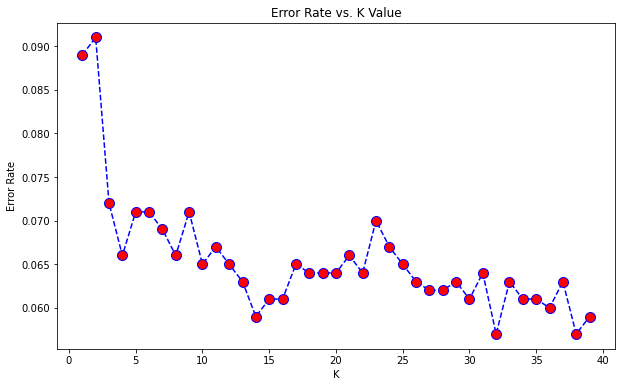

In [44]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate, color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

Here we can see that that after arouns K>23 the error rate just tends to hover around 0.06-0.05 Let's retrain the model with that and check the classification report!



Text(0, 0.5, 'Accuracy Rate')

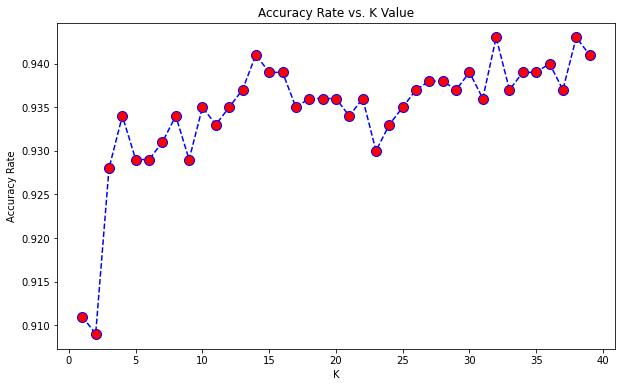

In [46]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),accuracy_rate, color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Accuracy Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy Rate')

In [47]:
# NOW WITH K=23
knn = KNeighborsClassifier(n_neighbors=23)

knn.fit(X_train,y_train)
pred = knn.predict(X_test)

print('WITH K=23')
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))

WITH K=23


[[131  17]
 [  6 146]]


              precision    recall  f1-score   support

           0       0.96      0.89      0.92       148
           1       0.90      0.96      0.93       152

    accuracy                           0.92       300
   macro avg       0.93      0.92      0.92       300
weighted avg       0.93      0.92      0.92       300

